# Homework 3
$\textbf{Name: Ty Nguyen}$  
$\textbf{ID: tynguyen}$

# 1. Base Networks: ConvNet, MobileNet, and ResNet (30%)
Before deep learning emerges, computer vision researchers design features to describe
and/or discriminate images, e.g., HOG, SIFT, Gist, etc. Nowadays, researchers turn to
design deep architectures to learn features that are useful for various tasks including ob-
ject recognition, object detection, and semantic segmentation. In this part, you will build
three base networks and compare their performance and efficiency using the CIFAR-10
dataset.

## 1.1. (5%) Train a network with architecture shown in Table 1.
All convolution should preserve the input resolution with stride 1. Use Adam opti-
mizer and exponential learning rate decay from 10 −3 to 10 −4 in 2, 000 iterations. Use
weight decay 0.05.
Report the final test accuracy and total training time. Count the total number of
multiplications in convolution layers. (Do not count batch normalization.)

### Final Test Accuracy: 63.2 %
### Training Time: 5132 seconds
### Total number of multiplications in convolution layers:
* conv 1, DK, M, N, DF = 32 3 32 32, compute 100663296
* conv 2, DK, M, N, DF = 32 32 64 32, compute 4294967296
* conv 3, DK, M, N, DF = 32 64 128 32, compute 25769803776
* conv 4, DK, M, N, DF = 32 128 256 32, compute 137438953472
* conv 5, DK, M, N, DF = 32 256 512 32, compute 687194767360
* Total Multiplications: 182636773376


In [1]:
import skimage.io as io 
import matplotlib.pyplot as plt 

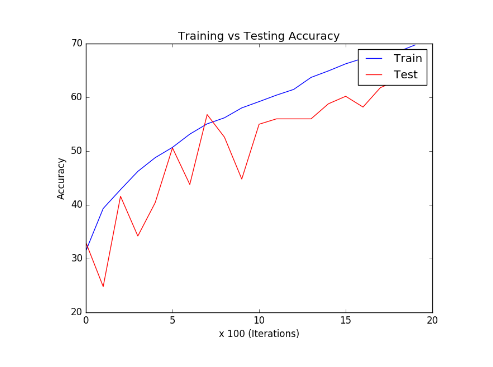

In [13]:
img = io.imread('/home/tynguyen/cis680/logs/HW3/part1/convnet/accuracy.png') 
fig = plt.figure(figsize=(8,7))
plt.imshow(img)
plt.axis('off')
plt.show()

## 1.2. (10%) Replace the first 4 convolution layers with the separable convolution layers as shown in Figure 1.

### Final Test Accuracy: 52.4 %
### Training Time: 1983 seconds
### Total number of multiplications in convolution layers:

* conv 1, DK, M, N, DF = 32 3 32 32, compute 3244032
* conv 2, DK, M, N, DF = 32 32 64 32, compute 35651584
* conv 3, DK, M, N, DF = 32 64 128 32, compute 75497472
* conv 4, DK, M, N, DF = 32 128 256 32, compute 167772160
* conv 5, DK, M, N, DF = 32 256 512 32, compute 137438953472
* Total Multiplications: 137721118720

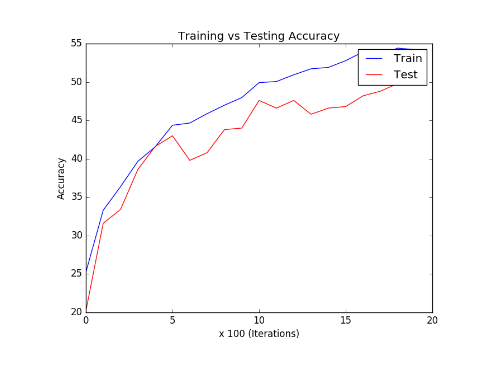

In [14]:
img = io.imread('/home/tynguyen/cis680/logs/HW3/part1/mobilenet/accuracy.png') 
fig = plt.figure(figsize=(8,7))
plt.imshow(img)
plt.axis('off')
plt.show()

## 1.3.  (10%) Replace the first 4 convolution layers with the residual blocks as shown in Figure 2.


### Final Test Accuracy: 64.3%
### Training Time: 4553 seconds
### Total number of multiplications in convolution layers:

* *Resblock conv 1, DK, M, N, DF = 32 3 32 32, compute 15728640
* *Resblock conv 2, DK, M, N, DF = 32 32 32 32, compute 1073741824
* *Resblock conv 3, DK, M, N, DF = 32 3 32 32, compute 100663296
* *Resblock conv 4, DK, M, N, DF = 32 32 64 32, compute 167772160
* *Resblock conv 5, DK, M, N, DF = 32 64 64 32, compute 4294967296
* *Resblock conv 6, DK, M, N, DF = 32 32 64 32, compute 2147483648
* *Resblock conv 7, DK, M, N, DF = 32 64 128 32, compute 335544320
* *Resblock conv 8, DK, M, N, DF = 32 128 128 32, compute 17179869184
* *Resblock conv 9, DK, M, N, DF = 32 64 128 32, compute 8589934592
* *Resblock conv 10, DK, M, N, DF = 32 128 256 32, compute 671088640
* *Resblock conv 11, DK, M, N, DF = 32 256 256 32, compute 68719476736
* *Resblock conv 12, DK, M, N, DF = 32 128 256 32, compute 34359738368
* conv 13, DK, M, N, DF = 32 256 512 32, compute 137438953472
* Total Multiplications: 275094962176




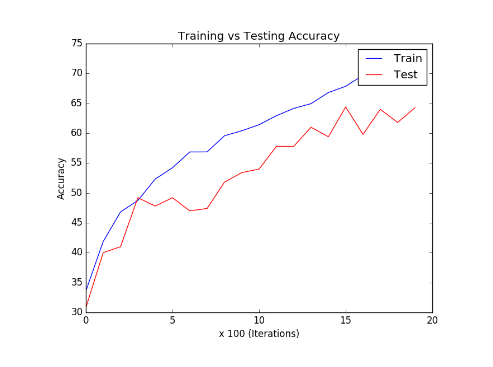

In [2]:
img = io.imread('/home/tynguyen/cis680/logs/HW3/part1/resnet/accuracy.png') 
fig = plt.figure(figsize=(8,7))
plt.imshow(img)
plt.axis('off')
plt.show()

## 1.4.  (5%) Compare and explain the results in the previous questions.
 

### Training accuracy

As we can see from the above results: 
* In running time: mobilenet runs the fastest because of less multiplication computations in Convolutional layers thanks to depth-wise convolutional layers, in comparison with Convnet. 
* In accuracy: resnet outperforms the other networks. This can be explained by the fact that it is deeper. Thanks to skip connections, resnet can goes deeper while retaining a decent running time. 

# 2. Region Proposal Network (40%)
In this part, you will build a region proposal network step by step with the base networks
you developed in the previous part. Region proposal network is a part of Faster R-CNN
(Figure 3) for localizing objects in an image.

## 2.1.  (20%) Build a base network as shown in Table 2.
ReLU activations, pooling and softmax layers. (No fully connected layer except for
softmax.) The test accuracy has to reach 68% with the same training procedure.
Feel free to use any image pre-processing or augmentation methods.
Provide a table that describes the network architecture. Plot the training accuracy
over training iterations and report the final test accuracy.

### Training accuracy

(-0.5, 799.5, 599.5, -0.5)

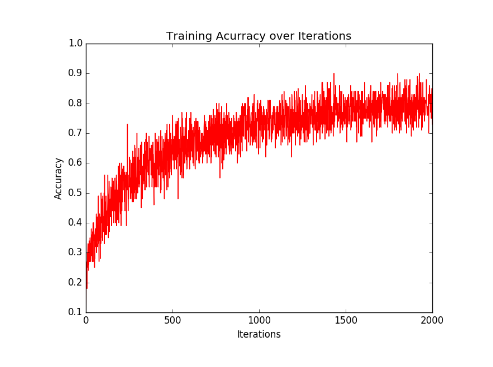

In [8]:
img =  cv2.imread('../../logs/HW2/customized_cnn_dropout_use_avg_pool/training_accuracy.png')
fig = plt.figure(figsize=(8,7))
plt.imshow(img)
plt.axis('off')

### Final Test Accuracy:  0.7033

### 2. (10%) Following the previous question, let's dene the magnitude of gradients in one

Plot the magnitude of gradients in the rst and last convolutional layers over training
iterations.

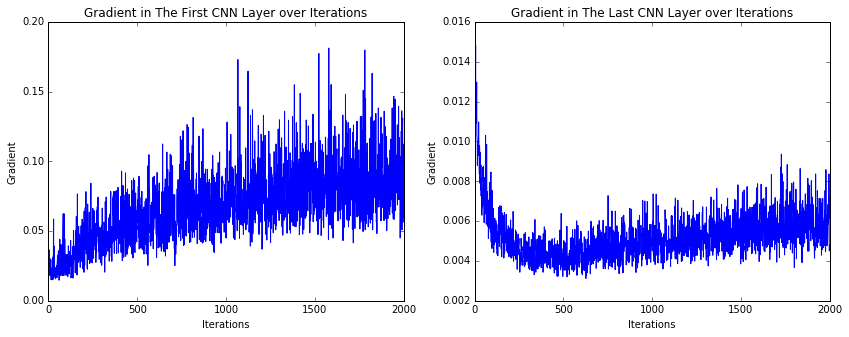

In [11]:
import numpy as np  
training_log_set = np.loadtxt('/home/tynguyen/cis680/logs/HW2/customized_cnn_dropout_use_avg_pool/train_accuracy.txt')
conv1_grad = training_log_set[:,3]
conv4_grad = training_log_set[:,4]
 
fig = plt.figure(figsize=(14,5))
plt.subplot(121)
plt.plot(conv1_grad)
plt.title('Gradient in The First CNN Layer over Iterations')
plt.xlabel('Iterations')
plt.ylabel('Gradient')
 

plt.subplot(122)
plt.plot(conv4_grad)
plt.title('Gradient in The Last CNN Layer over Iterations')
plt.xlabel('Iterations')
plt.ylabel('Gradient')

### 3. (10%) Between the first and second convolutional layers, add 20 convolutional layers,
each of which has kernel size (5,5), padding = 2, stride = 1. Also, remove all the
BatchNorm layers. Train the modied network on CIFAR-10 dataset again.
Plot the training accuracy over training iterations. Plot the magnitude of gradients
in the rst and last convolutional layers over training iterations. Explain what hap-
pened and why.

#### Training Accuracy

(-0.5, 799.5, 599.5, -0.5)

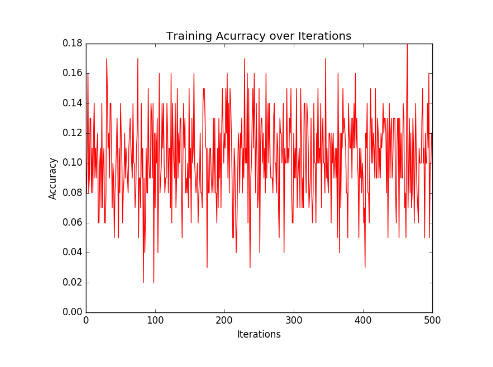

In [13]:
img =  cv2.imread('../../logs/HW2/customized_cnn_make_grad_vanish/training_accuracy.png')
fig = plt.figure(figsize=(8,7))
plt.imshow(img)
plt.axis('off')

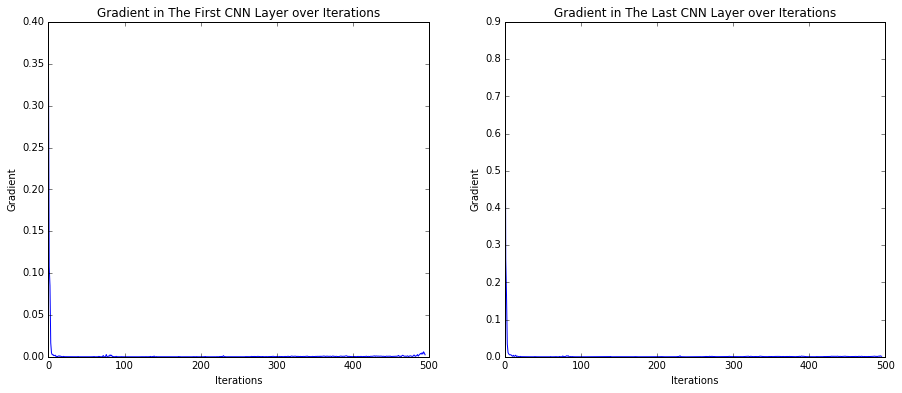

In [7]:
import numpy as np 
training_log_set = np.loadtxt('/home/tynguyen/cis680/logs/HW2/customized_cnn_make_grad_vanish/train_accuracy.txt')
conv1_grad = training_log_set[:,3]
conv4_grad = training_log_set[:,4]

fig = plt.figure(figsize=(15,6))
plt.subplot(121)
plt.plot(conv1_grad[4:])
plt.title('Gradient in The First CNN Layer over Iterations')
plt.xlabel('Iterations')
plt.ylabel('Gradient')
 

plt.subplot(122)
plt.plot(conv4_grad[4:])
plt.title('Gradient in The Last CNN Layer over Iterations')
plt.xlabel('Iterations')
plt.ylabel('Gradient')

#### Final Test Accuracy: 0.1004
As we can see from the above figures, the gradients values of the first and last layer come very close to zero. This causes the network not be able to learn and results in a very small accuracy both in training and testing. 
The reason for this issue is because we have added 20 more layers to the original netowork and lead to a very deep network which has a big issue with the chain rule in gradient back propogation approach. Since all the weights are initialized by normal distribution, the chain rule in a deep network will result in a very small gradients in lower layers and results in the gradient vanishing as we observe. 

### 4. (10%) Solve the problem you observed in the previous question without removing
any convolutional layer or adding any BatchNorm layer.
State your solution and explain why it works.

To solve the gradient vanishing problem, I make use of skip connections between two consecutive layers in the set of 20 layers added. I also use a skip connection between the first convolutional layer and the second one (in the oroginal network). Since there is no fully connected layer at the end, I use a 1x1 convolutional layer followed by an average pooling. Thanks to skip connections, I can also reduce the number of filters in each layer by 4 times. 
I also use dropout between every 10 layers. 

These modifications turn out to be succesful in solving the problem because skip connections allow a better information flow between the output layer and the lower layers such that the gradients can be transferrred to update the weights of lower layers. The dropouts boost up this process since they act as on/off switch so that different path in the network can be trained alternately. 

#### Training Accuracy

(-0.5, 799.5, 599.5, -0.5)

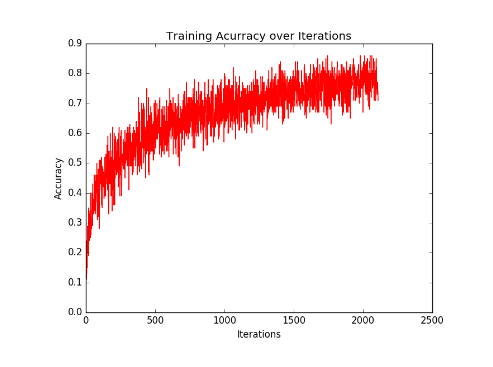

In [3]:
img =  cv2.imread('../../logs/HW2/customized_cnn_resolve_grad_vanish_13/training_accuracy.png')
fig = plt.figure(figsize=(8,7))
plt.imshow(img)
plt.axis('off')

#### Final Test Accuracy: 0.6807

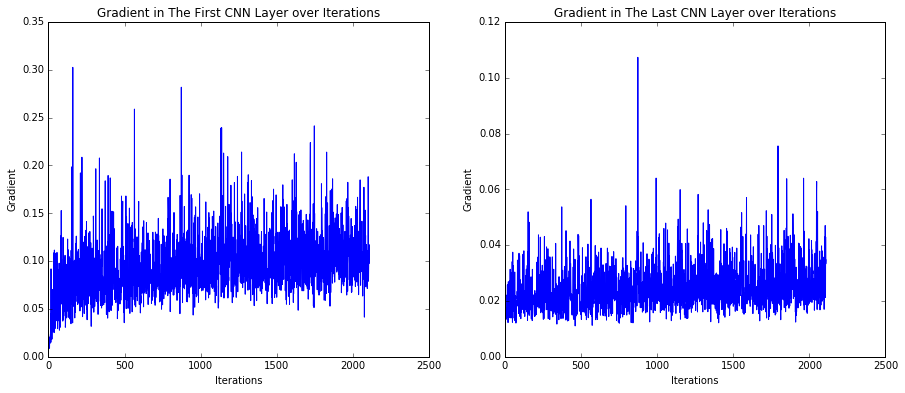

In [5]:
import numpy as np 
training_log_set = np.loadtxt('/home/tynguyen/cis680/logs/HW2/customized_cnn_resolve_grad_vanish_13/train_accuracy.txt')
conv1_grad = training_log_set[:,3]
conv4_grad = training_log_set[:,4]

fig = plt.figure(figsize=(15,6))
plt.subplot(121)
plt.plot(conv1_grad)
plt.title('Gradient in The First CNN Layer over Iterations')
plt.xlabel('Iterations')
plt.ylabel('Gradient')
 

plt.subplot(122)
plt.plot(conv4_grad)
plt.title('Gradient in The Last CNN Layer over Iterations')
plt.xlabel('Iterations')
plt.ylabel('Gradient')
 

## 3. Adversarial Images (40%)
Besides monitoring gradients, you can actually manipulate the gradients to create troubles
for the network. In this part, you will generate adversarial images for a CNN. Using those
adversarial images, you’ll be able to fool the network, making it wrong in an invisible
way. Furthermore, these adversarial images would also affect other CNNs. It exposes a
security issue of CNNs which hackers might take advantage of. An example is shown in
Figure 1.
You are encouraged to read the relevant papers [2, 3] before solving this part.

### 1. (30%) Use the trained network from part 1 to generate adversarial image.

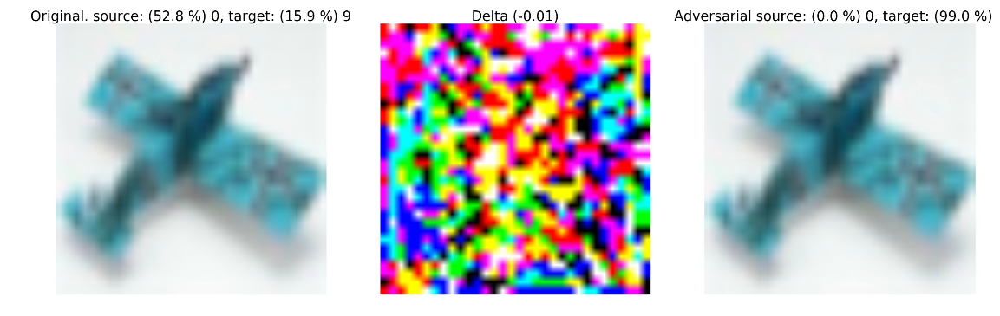

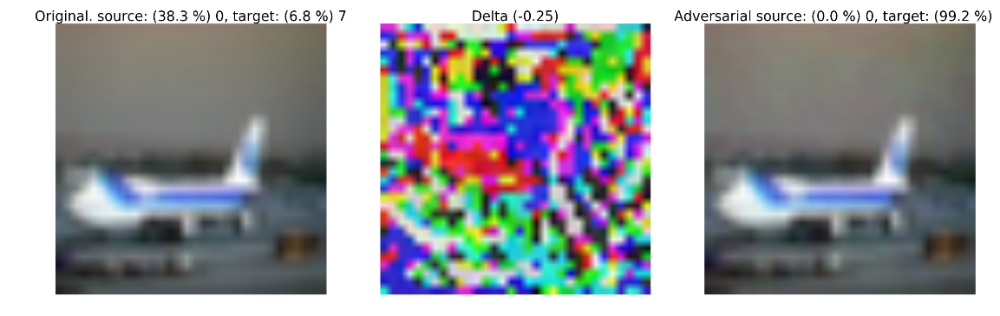

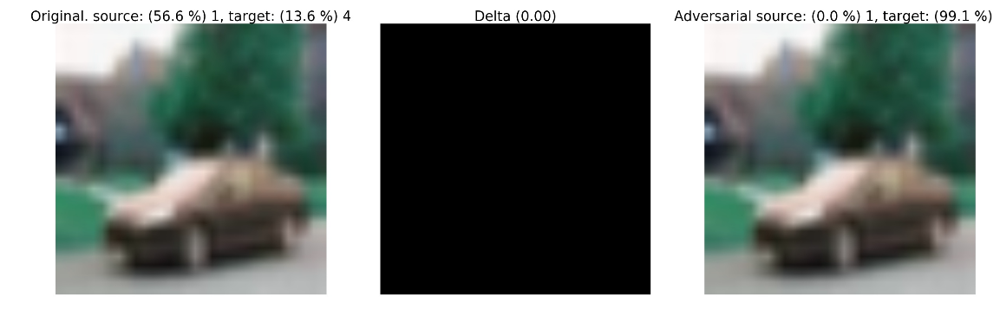

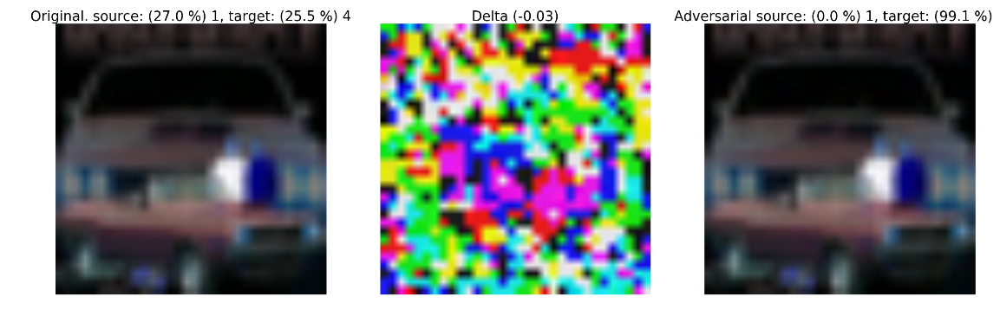

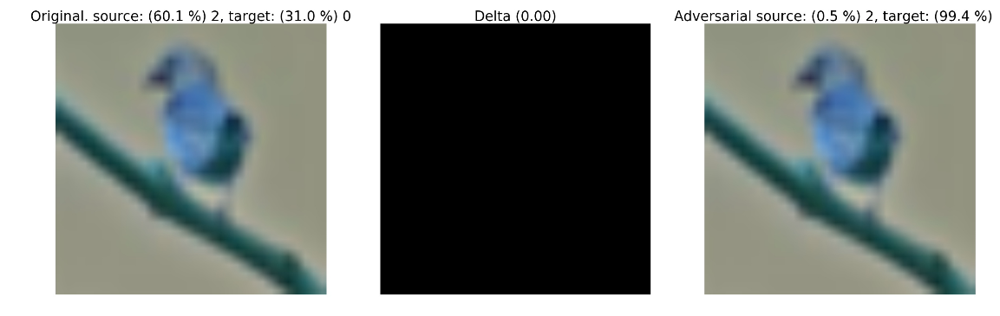

...

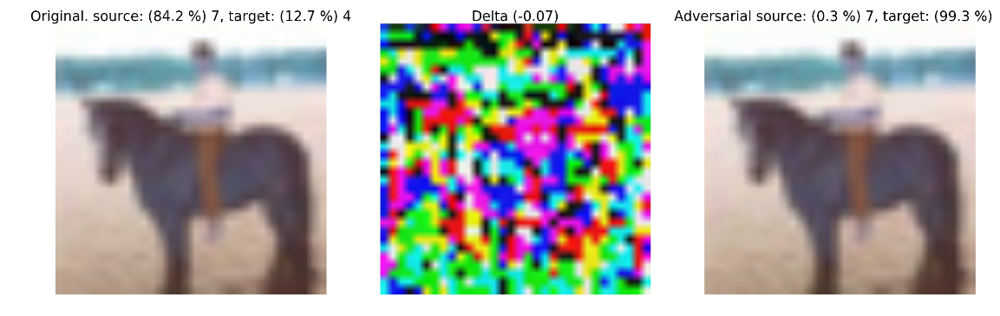

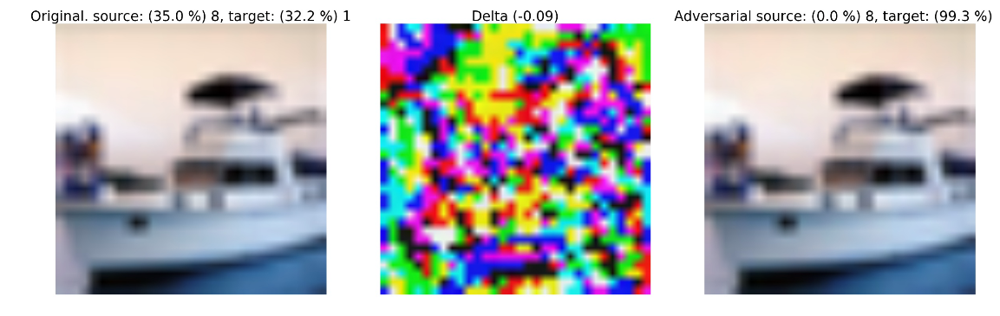

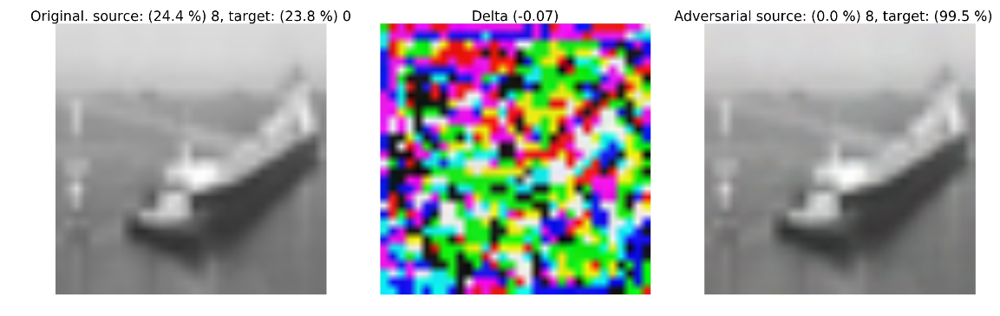

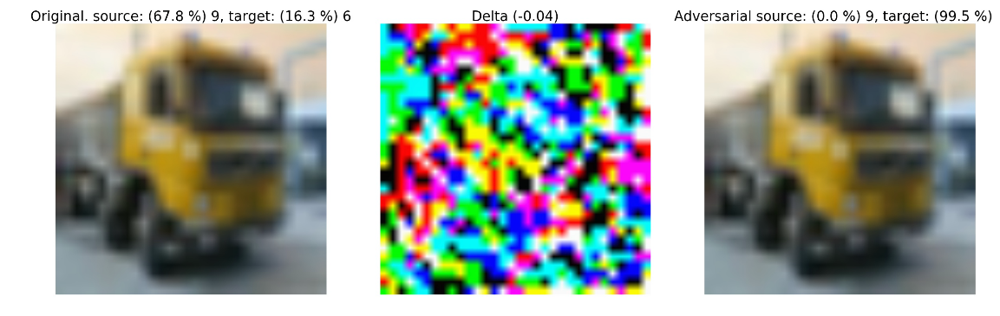

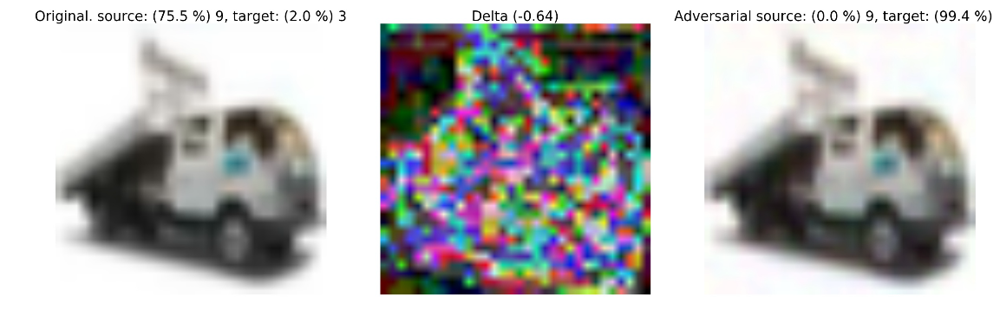

In [41]:
img_path = '../../data/results/adv/figs/'

for class_id in range(10):
    for index in range(1,3):
        img =  cv2.imread(os.path.join(img_path, str(class_id) + '_' + str(index) + '.jpg' ))
        img = img[120:850, 300:2750]
        fig = plt.figure(figsize=(20,20))
        plt.imshow(img)
        plt.axis('off')
        plt.show()
    

As we can see, the generated images (on the right) are very similar to the original ones (on the left). The middle images show the mean of the difference beetween the original and the pertubated images.  
Indeed, the pertubation is sometimes too small to be recognized by human eyes. 

### 2. (10%) Feed those adversarial images (generated in the previous question) into the
CNN trained in part 2. Report the test accuracy.
Explain why the test accuracy is low

Feed those adversarial images into the CNNs trained in part 2, I obtained the following results:
##### On my customized network, final test accuracy: 50% 
##### On my network after resolving gradient vanishing, final test accuracy: 35% 

The reason for this low accuracy is because these images are created by a network and test on the other networks which are different. This causes the adversarial images works in an opposite way from data augmentation and results in lower performance. 